<a href="https://colab.research.google.com/github/utamiu1807/-utami-creditcardclustering/blob/main/Copy_of_ML_Foundations_Applied_ML_Vision_Project_Part_1_Starter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install and Load Necessary Libraries

In [1]:
%pip -q install pillow pytesseract opencv-python ultralytics gdown

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 19.9 MB/s eta 0:00:00


In [2]:
from google.colab import userdata
from openai import OpenAI
import io, base64, json, os
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image
from google.colab import files
import pandas as pd
import gdown
import zipfile
import subprocess
import re

# Super Boring Code to Handle Data Plumbing Things
Such as converting the image to a format the API can understand, calling the foundation model API with the image and retrieving the response. There's also code here to download the datasets in zip format from Google Drive. To share a folder in Google Drive just click share -> and set General Access -> Anyone with the link. This creates a secret link that will give anyone access to this file, but the characters are so random nobody is likely to guess them in a few billion years.

In [3]:
import random
import os
import zipfile
import gdown

def download_and_extract_zip(file_id, extract_path='downloads', folder_name=None, sample_number=None):
    """
    Downloads a zip file from Google Drive using its file ID and extracts its contents.
    Navigates to a specified folder within the extracted contents, collects all image
    file paths recursively, and returns a random sample of these paths.

    Args:
        file_id (str): The Google Drive file ID of the zip file.
        extract_path (str, optional): The directory to extract the contents to.
                                      Defaults to 'downloads'.
        folder_name (str, optional): The name of a specific folder within the zip to process.
                                     Defaults to None.
        sample_number (int, optional): The number of image files to sample from the specified folder.
                                       If None or greater than the number of found images,
                                       all image paths are returned. Defaults to None.

    Returns:
        list: A list of sampled image file paths if successful, otherwise None.
    """
    output_zip_file = 'downloaded_images.zip'

    # Download the zip file using gdown
    print(f"Downloading Google Drive file ID: {file_id} to {output_zip_file}...")
    try:
        gdown.download(id=file_id, output=output_zip_file, quiet=False)
        print("Download complete.")
    except Exception as e:
        print(f"Error during gdown download: {e}")
        return None

    # Create the extraction directory if it doesn't exist
    os.makedirs(extract_path, exist_ok=True)

    # Extract the zip file
    try:
        with zipfile.ZipFile(output_zip_file, 'r') as zip_ref:
            zip_ref.extractall(extract_path)
        print(f"Zip file extracted to: {extract_path}")
    except zipfile.BadZipFile:
        print(f"Error: Downloaded file '{output_zip_file}' is not a valid zip file. Please ensure the Google Drive file ID is correct and the link provides the actual zip file content.")
        return None
    except FileNotFoundError:
        print(f"Error: Downloaded file '{output_zip_file}' not found. Check gdown output for download errors.")
        return None
    except Exception as e:
        print(f"An unexpected error occurred during extraction: {e}")
        return None

    # Determine the target path for image collection
    if folder_name:
        target_folder_path = os.path.join(extract_path, folder_name)
        if not os.path.exists(target_folder_path) or not os.path.isdir(target_folder_path):
            print(f"Error: Specified folder '{folder_name}' not found or is not a directory within the extracted contents.")
            return None
    else:
        target_folder_path = extract_path

    # Collect all image file paths recursively
    image_files = []
    for root, _, files in os.walk(target_folder_path):
        for file in files:
            if os.path.splitext(file)[1].lower() in ['.jpg', '.jpeg', '.png', '.gif']:
                image_files.append(os.path.join(root, file))

    print(f"Found {len(image_files)} image files in {target_folder_path} and its subfolders.")

    # Select a random sample of image file paths
    if sample_number is not None and len(image_files) > sample_number:
        sampled_image_files = random.sample(image_files, sample_number)
        print(f"Selected a sample of {len(sampled_image_files)} image files.")
    else:
        sampled_image_files = image_files
        if sample_number is not None:
             print(f"Sample number ({sample_number}) is greater than or equal to the total number of image files ({len(image_files)}). Returning all image files.")

    # Return the list of sampled image files
    return sampled_image_files

# Example usage:
file_id = '1qrjVsCQEPvnDk42oHYlnAgGGGMh594Rj'
extract_location = download_and_extract_zip(file_id)

# if extract_location:
#     image_folder = os.path.join(extract_location, "images") # Assuming images are in an 'images' subfolder
#     if os.path.exists(image_folder):
#         image_files = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if os.path.isfile(os.path.join(image_folder, f))]
#         print(f"Found {len(image_files)} image files in {image_folder}")
#         # print(image_files[:10]) # print first 10 for brevity
#     else:
#         print(f"Image folder not found at {image_folder}")

def to_data_url(path: str):
    """Read an image file and return a data URL string (e.g., 'data:image/jpeg;base64,...')."""
    # Heuristic for MIME type
    ext = path.lower().split('.')[-1]
    mime = 'image/jpeg' if ext in ['jpg', 'jpeg'] else 'image/png'
    with open(path, 'rb') as f:
        b64 = base64.b64encode(f.read()).decode('utf-8')
    return f"data:{mime};base64,{b64}"

def clean_json(raw: str):
    # 1. Strip leading/trailing whitespace
    cleaned = raw.strip()

    # 2. Remove markdown code fences (```json, ```)
    cleaned = re.sub(r"^```[a-zA-Z]*\s*", "", cleaned)   # remove starting ```json or ```
    cleaned = re.sub(r"\s*```$", "", cleaned)            # remove trailing ```

    # 3. Normalize fancy dashes (en/em dash → hyphen)
    cleaned = cleaned.replace("–", "-").replace("—", "-")

    return cleaned

/usr/local/lib/python3.12/dist-packages/gdown/download.py:33: XMLParsedAsHTMLWarning: It looks like you're using an HTML parser to parse an XML document.

Assuming this really is an XML document, what you're doing might work, but you should know that using an XML parser will be more reliable. To parse this document as XML, make sure you have the Python package 'lxml' installed, and pass the keyword argument `features="xml"` into the BeautifulSoup constructor.

If you want or need to use an HTML parser on this document, you can make this warning go away by filtering it. To do that, run this code before calling the BeautifulSoup constructor:

    from bs4 import XMLParsedAsHTMLWarning
    import warnings

    warnings.filterwarnings("ignore", category=XMLParsedAsHTMLWarning)

  soup = bs4.BeautifulSoup(line, features="html.parser")


Error during gdown download: Failed to retrieve file url:

	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses.
	Check FAQ in https://github.com/wkentaro/gdown?tab=readme-ov-file#faq.

You may still be able to access the file from the browser:

	https://drive.google.com/uc?id=1qrjVsCQEPvnDk42oHYlnAgGGGMh594Rj

but Gdown can't. Please check connections and permissions.


# Let's Explore Simple Vision with [Llama Vision](https://huggingface.co/meta-llama/Llama-4-Scout-17B-16E)

## Call to Llama for vision.
Chat GPT has the same interface. DeepSeek does not support images on our server.

In [4]:
jetstream_key = "sk-741aba4dc4c64831a5680304db841dd4"
jetstreamURL = "https://llm.jetstream-cloud.org/api"

client = OpenAI(base_url=jetstreamURL, api_key=jetstream_key)

# Choose a default multimodal model.
MODEL_NAME = 'llama-4-scout'

# Calling an image is similar to calling the standard chat prompt
def ask_vision(prompt_text: str, image_path: str, model: str = MODEL_NAME):
    data_url = to_data_url(image_path)
    resp = client.chat.completions.create(
        model=model,
        messages=[
            {"role": "user", "content": [
                {"type": "text", "text": prompt_text},
                {"type": "image_url", "image_url": {"url": data_url}},
            ]}
        ]
    )
    return resp.choices[0].message.content

## Basic Object Definitions

In [5]:
# These are the categories of images we will try to sort through with computer vision.
# https://github.com/fastai/imagenette

imagenette_labels = {
    "n01440764": "tench", # this is a kind of fish
    "n02102040": "English springer",
    "n02979186": "cassette player",
    "n03000684": "chain saw",
    "n03028079": "church",
    "n03394916": "French horn",
    "n03417042": "garbage truck",
    "n03425413": "gas pump",
    "n03445777": "golf ball",
    "n03888257": "parachute",
}

## Breads of Dogs Definitions

In [6]:
# Breeds of Dogs
# https://github.com/fastai/imagenette

image_woof_labels = {
"n02086240": "Shih-Tzu",
"n02087394": "Rhodesian ridgeback",
"n02088364": "Beagle",
"n02089973": "English foxhound",
"n02093754": "Australian terrier",
"n02096294": "Border terrier",
"n02099601": "Golden retriever",
"n02105641": "Old English sheepdog",
"n02111889": "Samoyed",
"n02115641": "Dingo"
}

## ImageNet100 Categories of Animals  Definitions

In [7]:
# @title
# ImageNet100 Categories of Animals
# This takes a bit to scroll through, but maybe it also helps
# to appreciate how many kinds of animals computer vision can
# cannot distinguish between.
# This dataset has 1300 rows per 50 categories for each class so total of 5,000
# images.
# https://www.kaggle.com/datasets/ambityga/imagenet100/data

imagenet100_labels = {
"n01968897": "chambered nautilus, pearly nautilus, nautilus",
"n01770081": "harvestman, daddy longlegs, Phalangium opilio",
"n01818515": "macaw",
"n02011460": "bittern",
"n01496331": "electric ray, crampfish, numbfish, torpedo",
"n01847000": "drake",
"n01687978": "agama",
"n01740131": "night snake, Hypsiglena torquata",
"n01537544": "indigo bunting, indigo finch, indigo bird, Passerina cyanea",
"n01491361": "tiger shark, Galeocerdo cuvieri",
"n02007558": "flamingo",
"n01735189": "garter snake, grass snake",
"n01630670": "common newt, Triturus vulgaris",
"n01440764": "tench, Tinca tinca",
"n01819313": "sulphur-crested cockatoo, Kakatoe galerita, Cacatua galerita",
"n02002556": "white stork, Ciconia ciconia",
"n01667778": "terrapin",
"n01755581": "diamondback, diamondback rattlesnake, Crotalus adamanteus",
"n01924916": "flatworm, platyhelminth",
"n01751748": "sea snake",
"n01984695": "spiny lobster, langouste, rock lobster, crawfish, crayfish, sea crawfish",
"n01729977": "green snake, grass snake",
"n01614925": "bald eagle, American eagle, Haliaeetus leucocephalus",
"n01608432": "kite",
"n01443537": "goldfish, Carassius auratus",
"n01770393": "scorpion",
"n01855672": "goose",
"n01560419": "bulbul",
"n01592084": "chickadee",
"n01914609": "sea anemone, anemone",
"n01582220": "magpie",
"n01667114": "mud turtle",
"n01985128": "crayfish, crawfish, crawdad, crawdaddy",
"n01820546": "lorikeet",
"n01773797": "garden spider, Aranea diademata",
"n02006656": "spoonbill",
"n01986214": "hermit crab",
"n01484850": "great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias",
"n01749939": "green mamba",
"n01828970": "bee eater",
"n02018795": "bustard",
"n01695060": "Komodo dragon, Komodo lizard, dragon lizard, giant lizard, Varanus komodoensis",
"n01729322": "hognose snake, puff adder, sand viper",
"n01677366": "common iguana, iguana, Iguana iguana",
"n01734418": "king snake, kingsnake",
"n01843383": "toucan",
"n01806143": "peacock",
"n01773549": "barn spider, Araneus cavaticus",
"n01775062": "wolf spider, hunting spider",
"n01728572": "thunder snake, worm snake, Carphophis amoenus",
"n01601694": "water ouzel, dipper",
"n01978287": "Dungeness crab, Cancer magister",
"n01930112": "nematode, nematode worm, roundworm",
"n01739381": "vine snake",
"n01883070": "wombat",
"n01774384": "black widow, Latrodectus mactans",
"n02037110": "oystercatcher, oyster catcher",
"n01795545": "black grouse",
"n02027492": "red-backed sandpiper, dunlin, Erolia alpina",
"n01531178": "goldfinch, Carduelis carduelis",
"n01944390": "snail",
"n01494475": "hammerhead, hammerhead shark",
"n01632458": "spotted salamander, Ambystoma maculatum",
"n01698640": "American alligator, Alligator mississipiensis",
"n01675722": "banded gecko",
"n01877812": "wallaby, brush kangaroo",
"n01622779": "great grey owl, great gray owl, Strix nebulosa",
"n01910747": "jellyfish",
"n01860187": "black swan, Cygnus atratus",
"n01796340": "ptarmigan",
"n01833805": "hummingbird",
"n01685808": "whiptail, whiptail lizard",
"n01756291": "sidewinder, horned rattlesnake, Crotalus cerastes",
"n01514859": "hen",
"n01753488": "horned viper, cerastes, sand viper, horned asp, Cerastes cornutus",
"n02058221": "albatross, mollymawk",
"n01632777": "axolotl, mud puppy, Ambystoma mexicanum",
"n01644900": "tailed frog, bell toad, ribbed toad, tailed toad, Ascaphus trui",
"n02018207": "American coot, marsh hen, mud hen, water hen, Fulica americana",
"n01664065": "loggerhead, loggerhead turtle, Caretta caretta",
"n02028035": "redshank, Tringa totanus",
"n02012849": "crane",
"n01776313": "tick",
"n02077923": "sea lion",
"n01774750": "tarantula",
"n01742172": "boa constrictor, Constrictor constrictor",
"n01943899": "conch",
"n01798484": "prairie chicken, prairie grouse, prairie fowl",
"n02051845": "pelican",
"n01824575": "coucal",
"n02013706": "limpkin, Aramus pictus",
"n01955084": "chiton, coat-of-mail shell, sea cradle, polyplacophore",
"n01773157": "black and gold garden spider, Argiope aurantia",
"n01665541": "leatherback turtle, leatherback, leathery turtle, Dermochelys coriacea",
"n01498041": "stingray",
"n01978455": "rock crab, Cancer irroratus",
"n01693334": "green lizard, Lacerta viridis",
"n01950731": "sea slug, nudibranch",
"n01829413": "hornbill",
"n01514668": "cock"
}

# Let's test the accuracy of LLAMA vision


### Run the Code Below to Analyze Imagenette Basic 10 Objects

In [39]:
# The dataset "imagennette" has 10 categories listed above. Each category is in a folder
# with it's correct synset

# When you share your zip file in Google Drive, you will get a link like this. Take
# the chunk of text in the middle and load it in the code below to analyze your own dataset
# Download and check out some of the images in this dataset to get a sense of what we are doing with
# computer vision.

#Information: https://github.com/fastai/imagenette?tab=readme-ov-file
#Source File: https://drive.google.com/file/d/1trWbAC1jmrDr8Vc-EHpw1roeXrluB-lc/view?usp=sharing

sample_file_id = '1trWbAC1jmrDr8Vc-EHpw1roeXrluB-lc'
sample_folder_name = 'imagenette-320_val' # Folder for a lower resolution version of imagenette
sample_labels = imagenette_labels

### Run the Code Below to Analyze Imagewoof - 10 Dog Breeds

In [40]:

#Information: https://github.com/fastai/imagenette?tab=readme-ov-file
#Source File: https://drive.google.com/file/d/1-uorupzHKd7WU1oZ9l-MJgM1nMpOIkUP/view?usp=sharing

sample_file_id = '1-uorupzHKd7WU1oZ9l-MJgM1nMpOIkUP'
sample_folder_name = 'imagewoof10_val' # imagenet subset of 10 dog breeds
sample_labels = image_woof_labels

### Run the Code Below for ImageNet 100 Classification of Animals

In [41]:
# I sampled 1000 images from the source dataset below to keep the file size down
# Information: https://www.kaggle.com/datasets/ambityga/imagenet100/data
# Source File: https://drive.google.com/file/d/1UiyPp2c56oIbEBkxldTCglx-t9qLYTeO/view?usp=sharing

#sample_file_id = '1UiyPp2c56oIbEBkxldTCglx-t9qLYTeO'
#sample_folder_name = 'imagenet100' # imagenet subset of 100 classes of animals
#sample_labels = imagenet100_labels

# Download and Sample N Images

In [47]:
sample_number = 100 # Number of images to sample

# Call the modified function
sampled_image_list = download_and_extract_zip(
    file_id=sample_file_id,
    folder_name=sample_folder_name,
    sample_number=sample_number
)

# Display the first few elements of the returned list
if sampled_image_list:
    print("\nSampled Image Paths (first 5):")
    for i, path in enumerate(sampled_image_list[:5]):
        print(path)
else:
    print("\nCould not retrieve sampled image paths.")

Downloading...
From (original): https://drive.google.com/uc?id=1-uorupzHKd7WU1oZ9l-MJgM1nMpOIkUP
From (redirected): https://drive.google.com/uc?id=1-uorupzHKd7WU1oZ9l-MJgM1nMpOIkUP&confirm=t&uuid=f3f4d717-a971-4de9-bd28-35005780d30f
To: /content/downloaded_images.zip
100%|██████████| 103M/103M [00:01<00:00, 74.4MB/s]


Download complete.
Zip file extracted to: downloads
Found 3929 image files in downloads/imagewoof10_val and its subfolders.
Selected a sample of 100 image files.

Sampled Image Paths (first 5):
downloads/imagewoof10_val/n02115641/n02115641_32260.JPEG
downloads/imagewoof10_val/n02111889/n02111889_6811.JPEG
downloads/imagewoof10_val/n02099601/n02099601_8772.JPEG
downloads/imagewoof10_val/n02086240/n02086240_10061.JPEG
downloads/imagewoof10_val/n02096294/n02096294_4022.JPEG


## Prompt for extracting classification from images

In [48]:
# This dataset is a small piece of the classic ImageNet dataset for testing the accuracy of algorithms

prompt = f"""

You are an expert image classifier classifying images from ImageNet.
Classify this image into one of the following synset categories and their descriptions in the JSON below.
Only return the synset labels shown in the JSON below and no other text.

{sample_labels}
"""

print(prompt)



You are an expert image classifier classifying images from ImageNet.
Classify this image into one of the following synset categories and their descriptions in the JSON below.
Only return the synset labels shown in the JSON below and no other text.

{'n02086240': 'Shih-Tzu', 'n02087394': 'Rhodesian ridgeback', 'n02088364': 'Beagle', 'n02089973': 'English foxhound', 'n02093754': 'Australian terrier', 'n02096294': 'Border terrier', 'n02099601': 'Golden retriever', 'n02105641': 'Old English sheepdog', 'n02111889': 'Samoyed', 'n02115641': 'Dingo'}



# Run the code below and watch the prediction happen!

Processing image: downloads/imagewoof10_val/n02115641/n02115641_32260.JPEG
-----------------------------------------------
Total predictions: 1
Correct predictions: 1
Accuracy: 100.00%


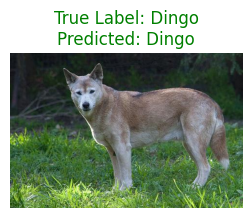

Processing image: downloads/imagewoof10_val/n02111889/n02111889_6811.JPEG
-----------------------------------------------
Total predictions: 2
Correct predictions: 2
Accuracy: 100.00%


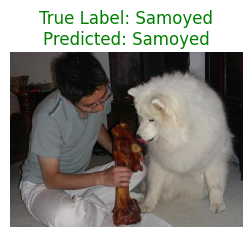

Processing image: downloads/imagewoof10_val/n02099601/n02099601_8772.JPEG
-----------------------------------------------
Total predictions: 3
Correct predictions: 3
Accuracy: 100.00%


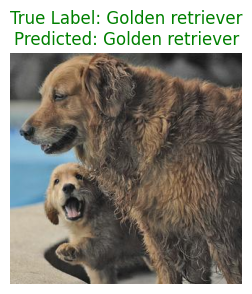

Processing image: downloads/imagewoof10_val/n02086240/n02086240_10061.JPEG
-----------------------------------------------
Total predictions: 4
Correct predictions: 4
Accuracy: 100.00%


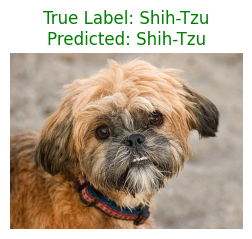

Processing image: downloads/imagewoof10_val/n02096294/n02096294_4022.JPEG
-----------------------------------------------
Total predictions: 5
Correct predictions: 4
Accuracy: 80.00%


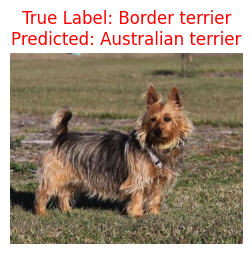

Processing image: downloads/imagewoof10_val/n02089973/n02089973_1310.JPEG
-----------------------------------------------
Total predictions: 6
Correct predictions: 4
Accuracy: 66.67%


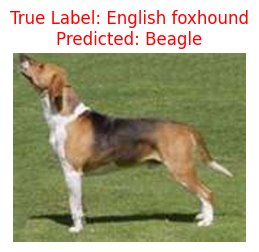

Processing image: downloads/imagewoof10_val/n02086240/n02086240_4872.JPEG
-----------------------------------------------
Total predictions: 7
Correct predictions: 5
Accuracy: 71.43%


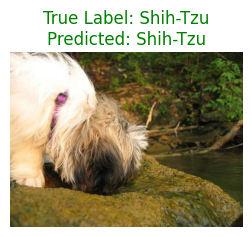

Processing image: downloads/imagewoof10_val/n02086240/n02086240_1030.JPEG
-----------------------------------------------
Total predictions: 8
Correct predictions: 6
Accuracy: 75.00%


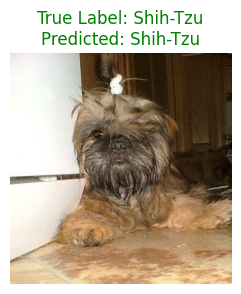

Processing image: downloads/imagewoof10_val/n02111889/n02111889_17251.JPEG
-----------------------------------------------
Total predictions: 9
Correct predictions: 7
Accuracy: 77.78%


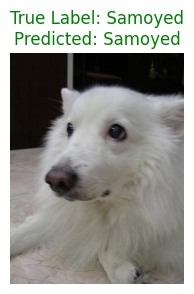

Processing image: downloads/imagewoof10_val/n02115641/n02115641_34130.JPEG
-----------------------------------------------
Total predictions: 10
Correct predictions: 8
Accuracy: 80.00%


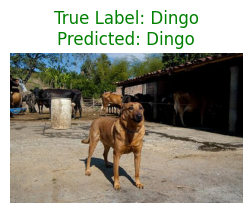

Processing image: downloads/imagewoof10_val/n02086240/n02086240_2530.JPEG
-----------------------------------------------
Total predictions: 11
Correct predictions: 9
Accuracy: 81.82%


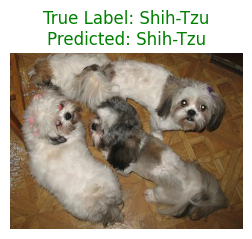

Processing image: downloads/imagewoof10_val/n02105641/n02105641_12000.JPEG
-----------------------------------------------
Total predictions: 12
Correct predictions: 10
Accuracy: 83.33%


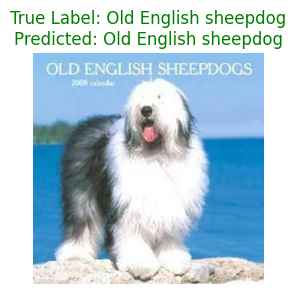

Processing image: downloads/imagewoof10_val/n02099601/n02099601_1972.JPEG
-----------------------------------------------
Total predictions: 13
Correct predictions: 11
Accuracy: 84.62%


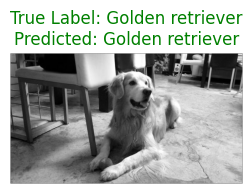

Processing image: downloads/imagewoof10_val/n02111889/n02111889_4261.JPEG
-----------------------------------------------
Total predictions: 14
Correct predictions: 12
Accuracy: 85.71%


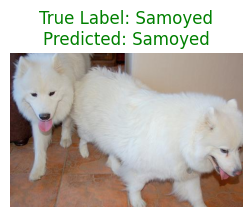

Processing image: downloads/imagewoof10_val/n02088364/n02088364_5182.JPEG
-----------------------------------------------
Total predictions: 15
Correct predictions: 13
Accuracy: 86.67%


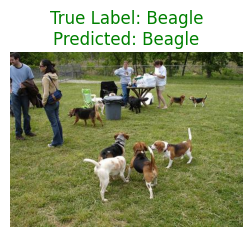

Processing image: downloads/imagewoof10_val/n02099601/n02099601_7692.JPEG
-----------------------------------------------
Total predictions: 16
Correct predictions: 14
Accuracy: 87.50%


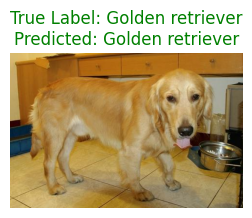

Processing image: downloads/imagewoof10_val/n02087394/n02087394_9350.JPEG
-----------------------------------------------
Total predictions: 17
Correct predictions: 14
Accuracy: 82.35%


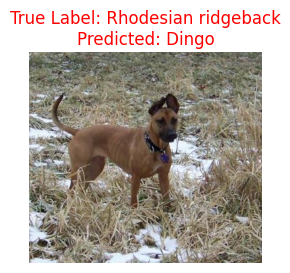

Processing image: downloads/imagewoof10_val/n02105641/n02105641_5781.JPEG
-----------------------------------------------
Total predictions: 18
Correct predictions: 15
Accuracy: 83.33%


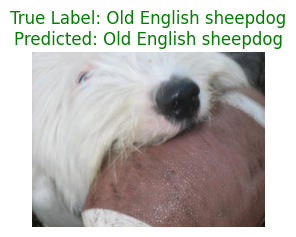

Processing image: downloads/imagewoof10_val/n02111889/n02111889_3221.JPEG
-----------------------------------------------
Total predictions: 19
Correct predictions: 16
Accuracy: 84.21%


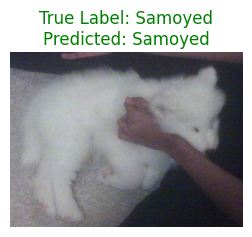

Processing image: downloads/imagewoof10_val/n02086240/n02086240_5590.JPEG
-----------------------------------------------
Total predictions: 20
Correct predictions: 17
Accuracy: 85.00%


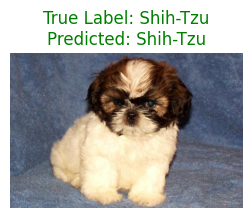

Processing image: downloads/imagewoof10_val/n02099601/n02099601_10780.JPEG
-----------------------------------------------
Total predictions: 21
Correct predictions: 18
Accuracy: 85.71%


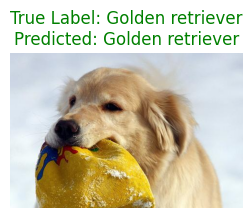

Processing image: downloads/imagewoof10_val/n02086240/n02086240_5902.JPEG
-----------------------------------------------
Total predictions: 22
Correct predictions: 19
Accuracy: 86.36%


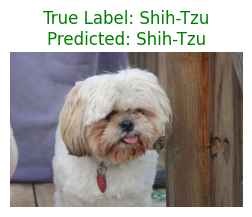

Processing image: downloads/imagewoof10_val/n02086240/n02086240_1342.JPEG
-----------------------------------------------
Total predictions: 23
Correct predictions: 20
Accuracy: 86.96%


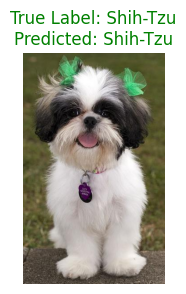

Processing image: downloads/imagewoof10_val/n02105641/n02105641_10660.JPEG
-----------------------------------------------
Total predictions: 24
Correct predictions: 21
Accuracy: 87.50%


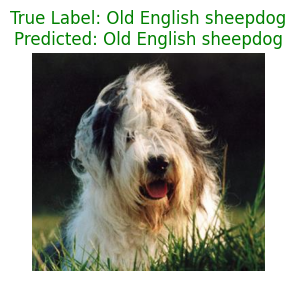

Processing image: downloads/imagewoof10_val/n02105641/n02105641_4992.JPEG
-----------------------------------------------
Total predictions: 25
Correct predictions: 22
Accuracy: 88.00%


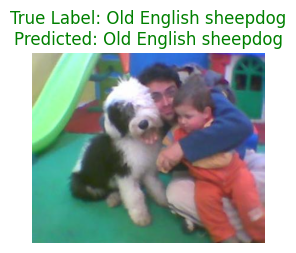

Processing image: downloads/imagewoof10_val/n02086240/n02086240_5840.JPEG
-----------------------------------------------
Total predictions: 26
Correct predictions: 22
Accuracy: 84.62%


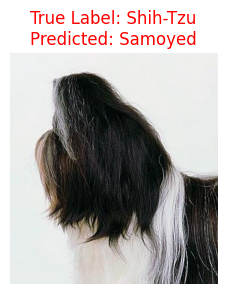

Processing image: downloads/imagewoof10_val/n02105641/ILSVRC2012_val_00039591.JPEG
-----------------------------------------------
Total predictions: 27
Correct predictions: 23
Accuracy: 85.19%


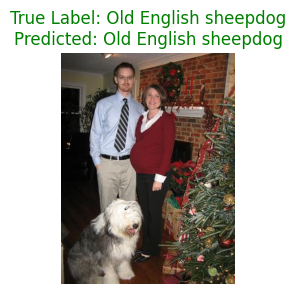

Processing image: downloads/imagewoof10_val/n02099601/n02099601_1932.JPEG
-----------------------------------------------
Total predictions: 28
Correct predictions: 24
Accuracy: 85.71%


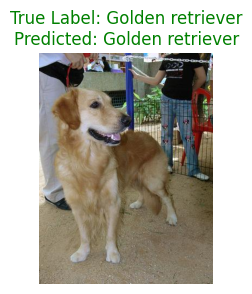

Processing image: downloads/imagewoof10_val/n02093754/n02093754_3530.JPEG
-----------------------------------------------
Total predictions: 29
Correct predictions: 24
Accuracy: 82.76%


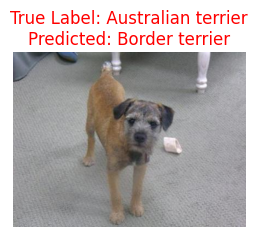

Processing image: downloads/imagewoof10_val/n02105641/n02105641_7242.JPEG
-----------------------------------------------
Total predictions: 30
Correct predictions: 25
Accuracy: 83.33%


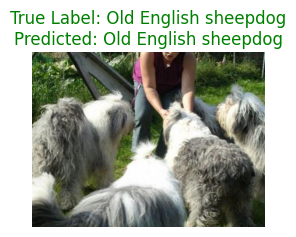

Processing image: downloads/imagewoof10_val/n02086240/n02086240_4620.JPEG
-----------------------------------------------
Total predictions: 31
Correct predictions: 26
Accuracy: 83.87%


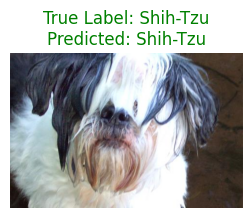

Processing image: downloads/imagewoof10_val/n02099601/n02099601_3111.JPEG
-----------------------------------------------
Total predictions: 32
Correct predictions: 27
Accuracy: 84.38%


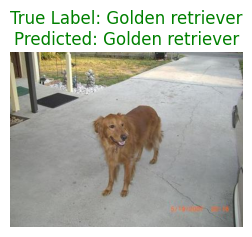

Processing image: downloads/imagewoof10_val/n02096294/n02096294_4440.JPEG
-----------------------------------------------
Total predictions: 33
Correct predictions: 27
Accuracy: 81.82%


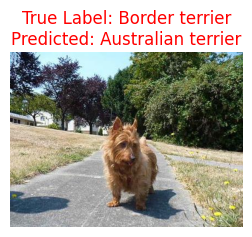

Processing image: downloads/imagewoof10_val/n02096294/n02096294_7161.JPEG
-----------------------------------------------
Total predictions: 34
Correct predictions: 27
Accuracy: 79.41%


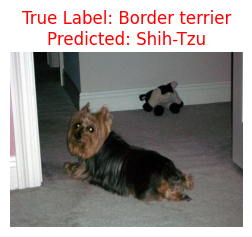

Processing image: downloads/imagewoof10_val/n02105641/n02105641_6040.JPEG
-----------------------------------------------
Total predictions: 35
Correct predictions: 28
Accuracy: 80.00%


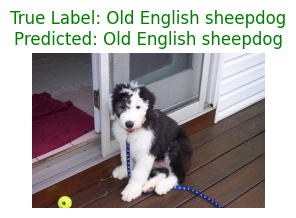

Processing image: downloads/imagewoof10_val/n02099601/n02099601_4241.JPEG
-----------------------------------------------
Total predictions: 36
Correct predictions: 29
Accuracy: 80.56%


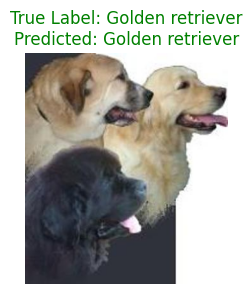

Processing image: downloads/imagewoof10_val/n02096294/n02096294_3552.JPEG
-----------------------------------------------
Total predictions: 37
Correct predictions: 29
Accuracy: 78.38%


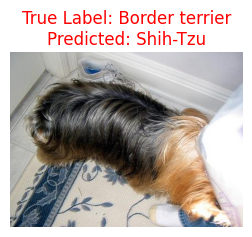

Processing image: downloads/imagewoof10_val/n02111889/n02111889_6162.JPEG
-----------------------------------------------
Total predictions: 38
Correct predictions: 30
Accuracy: 78.95%


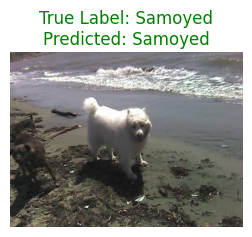

Processing image: downloads/imagewoof10_val/n02111889/n02111889_7651.JPEG
-----------------------------------------------
Total predictions: 39
Correct predictions: 31
Accuracy: 79.49%


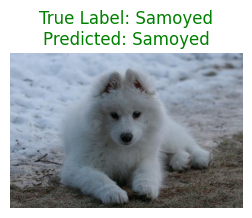

Processing image: downloads/imagewoof10_val/n02086240/n02086240_3832.JPEG
-----------------------------------------------
Total predictions: 40
Correct predictions: 32
Accuracy: 80.00%


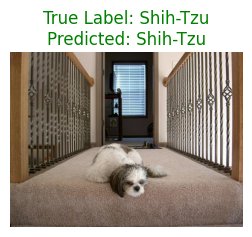

Processing image: downloads/imagewoof10_val/n02087394/n02087394_3171.JPEG
-----------------------------------------------
Total predictions: 41
Correct predictions: 33
Accuracy: 80.49%


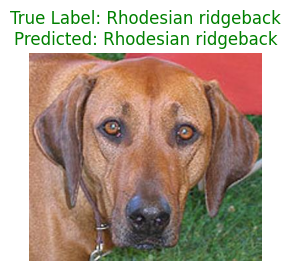

Processing image: downloads/imagewoof10_val/n02093754/n02093754_6220.JPEG
-----------------------------------------------
Total predictions: 42
Correct predictions: 33
Accuracy: 78.57%


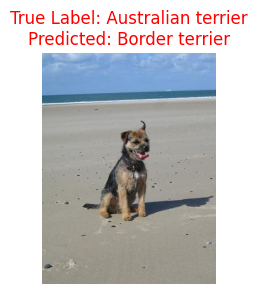

Processing image: downloads/imagewoof10_val/n02087394/n02087394_9520.JPEG
-----------------------------------------------
Total predictions: 43
Correct predictions: 34
Accuracy: 79.07%


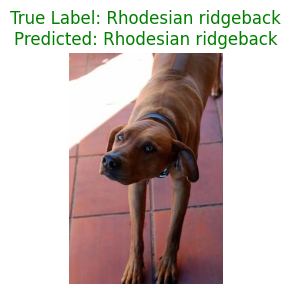

Processing image: downloads/imagewoof10_val/n02096294/n02096294_1302.JPEG
-----------------------------------------------
Total predictions: 44
Correct predictions: 34
Accuracy: 77.27%


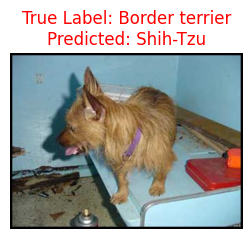

Processing image: downloads/imagewoof10_val/n02088364/n02088364_8471.JPEG
-----------------------------------------------
Total predictions: 45
Correct predictions: 35
Accuracy: 77.78%


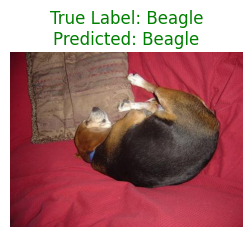

Processing image: downloads/imagewoof10_val/n02096294/n02096294_1750.JPEG
-----------------------------------------------
Total predictions: 46
Correct predictions: 35
Accuracy: 76.09%


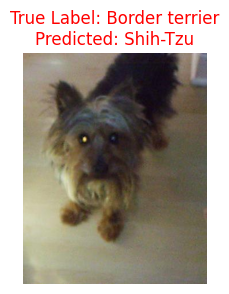

Processing image: downloads/imagewoof10_val/n02111889/ILSVRC2012_val_00024330.JPEG
-----------------------------------------------
Total predictions: 47
Correct predictions: 36
Accuracy: 76.60%


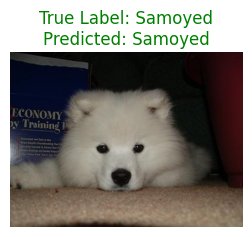

Processing image: downloads/imagewoof10_val/n02089973/n02089973_3820.JPEG
-----------------------------------------------
Total predictions: 48
Correct predictions: 36
Accuracy: 75.00%


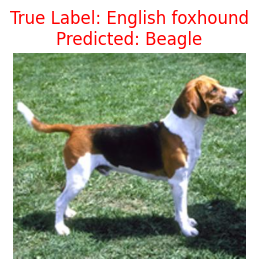

Processing image: downloads/imagewoof10_val/n02086240/n02086240_7691.JPEG
-----------------------------------------------
Total predictions: 49
Correct predictions: 37
Accuracy: 75.51%


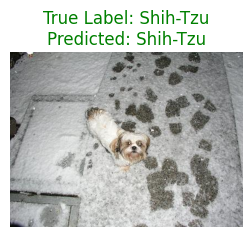

Processing image: downloads/imagewoof10_val/n02089973/n02089973_1472.JPEG
-----------------------------------------------
Total predictions: 50
Correct predictions: 38
Accuracy: 76.00%


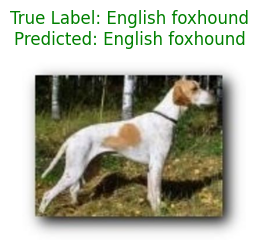

Processing image: downloads/imagewoof10_val/n02115641/n02115641_9731.JPEG
-----------------------------------------------
Total predictions: 51
Correct predictions: 39
Accuracy: 76.47%


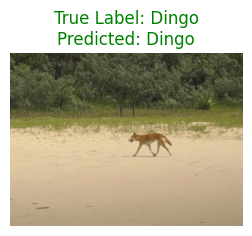

Processing image: downloads/imagewoof10_val/n02099601/ILSVRC2012_val_00031731.JPEG
-----------------------------------------------
Total predictions: 52
Correct predictions: 40
Accuracy: 76.92%


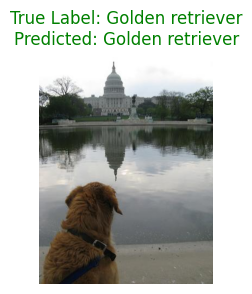

Processing image: downloads/imagewoof10_val/n02087394/n02087394_4451.JPEG
-----------------------------------------------
Total predictions: 53
Correct predictions: 41
Accuracy: 77.36%


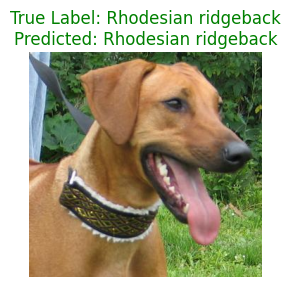

Processing image: downloads/imagewoof10_val/n02093754/n02093754_3761.JPEG
-----------------------------------------------
Total predictions: 54
Correct predictions: 41
Accuracy: 75.93%


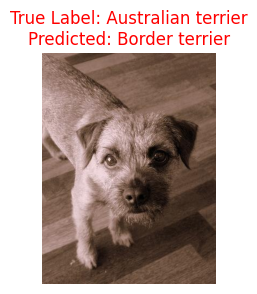

Processing image: downloads/imagewoof10_val/n02086240/n02086240_831.JPEG
-----------------------------------------------
Total predictions: 55
Correct predictions: 42
Accuracy: 76.36%


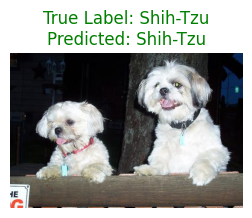

Processing image: downloads/imagewoof10_val/n02096294/n02096294_472.JPEG
-----------------------------------------------
Total predictions: 56
Correct predictions: 42
Accuracy: 75.00%


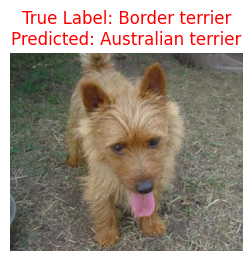

Processing image: downloads/imagewoof10_val/n02087394/n02087394_10480.JPEG
-----------------------------------------------
Total predictions: 57
Correct predictions: 42
Accuracy: 73.68%


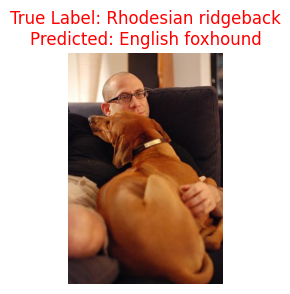

Processing image: downloads/imagewoof10_val/n02099601/n02099601_2041.JPEG
-----------------------------------------------
Total predictions: 58
Correct predictions: 42
Accuracy: 72.41%


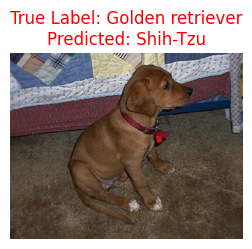

Processing image: downloads/imagewoof10_val/n02115641/n02115641_23142.JPEG
-----------------------------------------------
Total predictions: 59
Correct predictions: 42
Accuracy: 71.19%


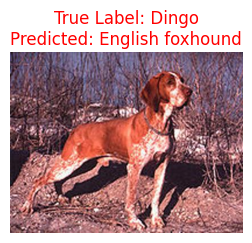

Processing image: downloads/imagewoof10_val/n02099601/n02099601_1781.JPEG
-----------------------------------------------
Total predictions: 60
Correct predictions: 43
Accuracy: 71.67%


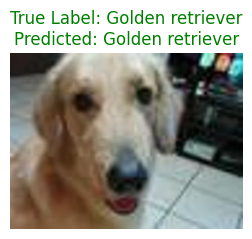

Processing image: downloads/imagewoof10_val/n02111889/n02111889_13672.JPEG
-----------------------------------------------
Total predictions: 61
Correct predictions: 44
Accuracy: 72.13%


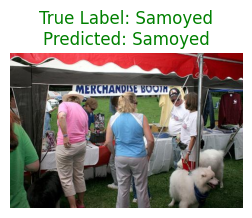

Processing image: downloads/imagewoof10_val/n02105641/n02105641_7512.JPEG
-----------------------------------------------
Total predictions: 62
Correct predictions: 45
Accuracy: 72.58%


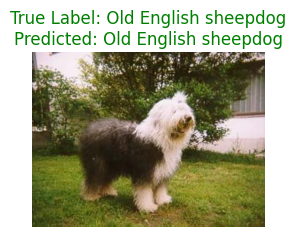

Processing image: downloads/imagewoof10_val/n02105641/n02105641_6971.JPEG
-----------------------------------------------
Total predictions: 63
Correct predictions: 46
Accuracy: 73.02%


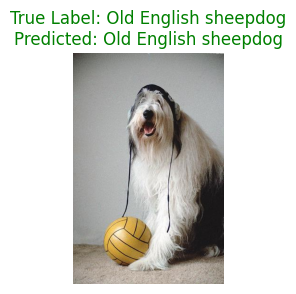

Processing image: downloads/imagewoof10_val/n02093754/n02093754_110.JPEG
-----------------------------------------------
Total predictions: 64
Correct predictions: 46
Accuracy: 71.88%


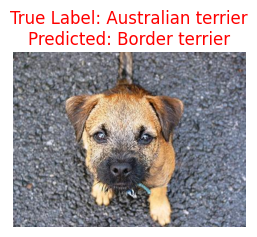

Processing image: downloads/imagewoof10_val/n02089973/n02089973_1870.JPEG
-----------------------------------------------
Total predictions: 65
Correct predictions: 46
Accuracy: 70.77%


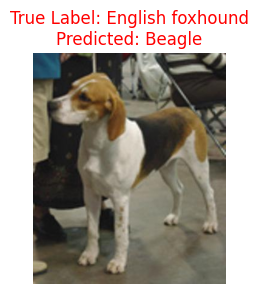

Processing image: downloads/imagewoof10_val/n02088364/n02088364_1890.JPEG
-----------------------------------------------
Total predictions: 66
Correct predictions: 47
Accuracy: 71.21%


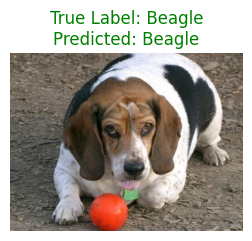

Processing image: downloads/imagewoof10_val/n02105641/n02105641_6011.JPEG
-----------------------------------------------
Total predictions: 67
Correct predictions: 47
Accuracy: 70.15%


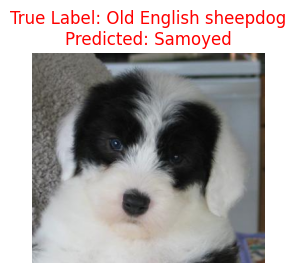

Processing image: downloads/imagewoof10_val/n02093754/n02093754_4452.JPEG
-----------------------------------------------
Total predictions: 68
Correct predictions: 47
Accuracy: 69.12%


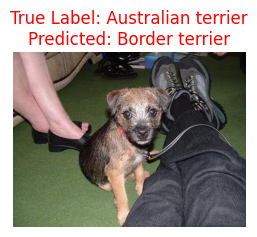

Processing image: downloads/imagewoof10_val/n02087394/n02087394_18182.JPEG
-----------------------------------------------
Total predictions: 69
Correct predictions: 48
Accuracy: 69.57%


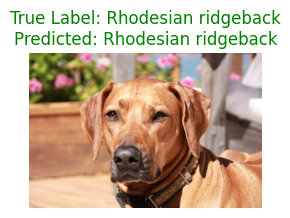

Processing image: downloads/imagewoof10_val/n02087394/n02087394_531.JPEG
-----------------------------------------------
Total predictions: 70
Correct predictions: 48
Accuracy: 68.57%


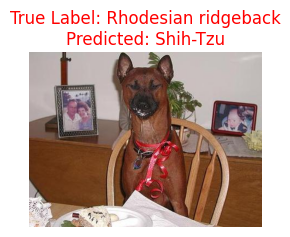

Processing image: downloads/imagewoof10_val/n02087394/n02087394_8851.JPEG
-----------------------------------------------
Total predictions: 71
Correct predictions: 49
Accuracy: 69.01%


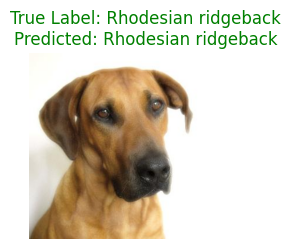

Processing image: downloads/imagewoof10_val/n02096294/n02096294_4280.JPEG
-----------------------------------------------
Total predictions: 72
Correct predictions: 49
Accuracy: 68.06%


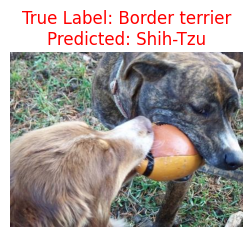

Processing image: downloads/imagewoof10_val/n02093754/n02093754_602.JPEG
-----------------------------------------------
Total predictions: 73
Correct predictions: 49
Accuracy: 67.12%


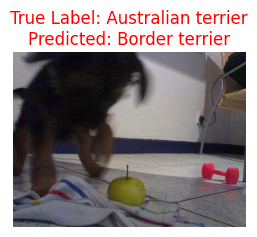

Processing image: downloads/imagewoof10_val/n02087394/n02087394_14840.JPEG
-----------------------------------------------
Total predictions: 74
Correct predictions: 50
Accuracy: 67.57%


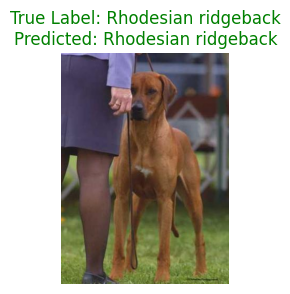

Processing image: downloads/imagewoof10_val/n02088364/n02088364_12730.JPEG
-----------------------------------------------
Total predictions: 75
Correct predictions: 51
Accuracy: 68.00%


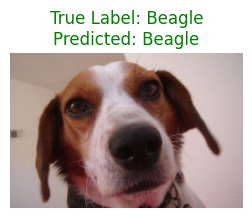

Processing image: downloads/imagewoof10_val/n02086240/n02086240_762.JPEG
-----------------------------------------------
Total predictions: 76
Correct predictions: 52
Accuracy: 68.42%


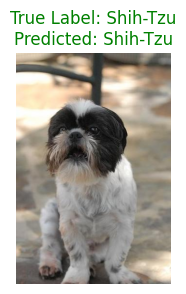

Processing image: downloads/imagewoof10_val/n02111889/n02111889_5681.JPEG
-----------------------------------------------
Total predictions: 77
Correct predictions: 53
Accuracy: 68.83%


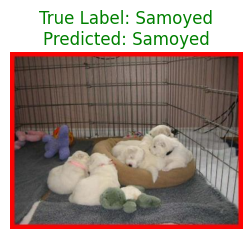

Processing image: downloads/imagewoof10_val/n02115641/n02115641_8560.JPEG
-----------------------------------------------
Total predictions: 78
Correct predictions: 53
Accuracy: 67.95%


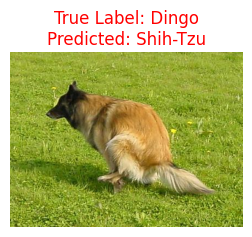

Processing image: downloads/imagewoof10_val/n02087394/n02087394_6330.JPEG
-----------------------------------------------
Total predictions: 79
Correct predictions: 54
Accuracy: 68.35%


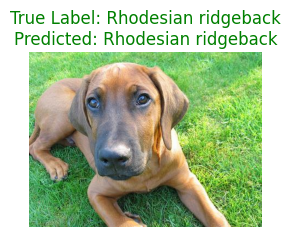

Processing image: downloads/imagewoof10_val/n02086240/n02086240_8451.JPEG
-----------------------------------------------
Total predictions: 80
Correct predictions: 55
Accuracy: 68.75%


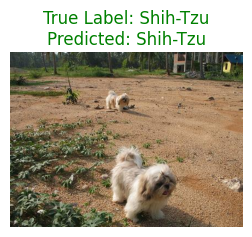

Processing image: downloads/imagewoof10_val/n02086240/n02086240_2722.JPEG
-----------------------------------------------
Total predictions: 81
Correct predictions: 56
Accuracy: 69.14%


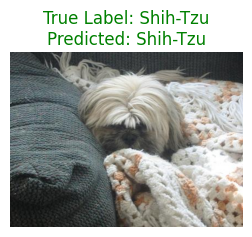

Processing image: downloads/imagewoof10_val/n02088364/n02088364_4691.JPEG
-----------------------------------------------
Total predictions: 82
Correct predictions: 57
Accuracy: 69.51%


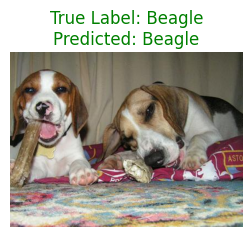

Processing image: downloads/imagewoof10_val/n02088364/n02088364_2362.JPEG
-----------------------------------------------
Total predictions: 83
Correct predictions: 58
Accuracy: 69.88%


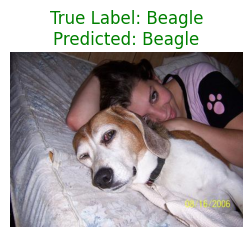

Processing image: downloads/imagewoof10_val/n02089973/n02089973_6321.JPEG
-----------------------------------------------
Total predictions: 84
Correct predictions: 59
Accuracy: 70.24%


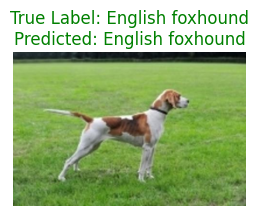

Processing image: downloads/imagewoof10_val/n02093754/n02093754_1791.JPEG
-----------------------------------------------
Total predictions: 85
Correct predictions: 59
Accuracy: 69.41%


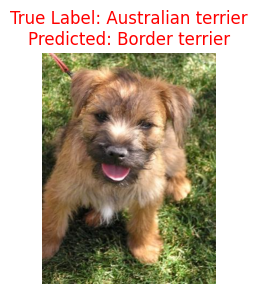

Processing image: downloads/imagewoof10_val/n02088364/n02088364_13822.JPEG
-----------------------------------------------
Total predictions: 86
Correct predictions: 60
Accuracy: 69.77%


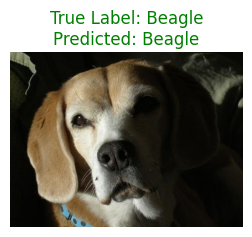

Processing image: downloads/imagewoof10_val/n02105641/n02105641_3192.JPEG
-----------------------------------------------
Total predictions: 87
Correct predictions: 61
Accuracy: 70.11%


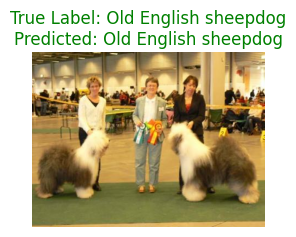

Processing image: downloads/imagewoof10_val/n02115641/n02115641_4201.JPEG
-----------------------------------------------
Total predictions: 88
Correct predictions: 61
Accuracy: 69.32%


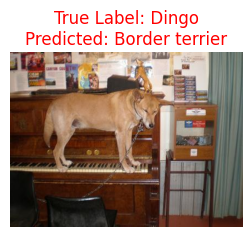

Processing image: downloads/imagewoof10_val/n02089973/n02089973_4292.JPEG
-----------------------------------------------
Total predictions: 89
Correct predictions: 62
Accuracy: 69.66%


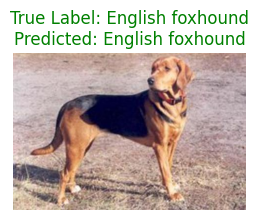

Processing image: downloads/imagewoof10_val/n02086240/ILSVRC2012_val_00045970.JPEG
-----------------------------------------------
Total predictions: 90
Correct predictions: 63
Accuracy: 70.00%


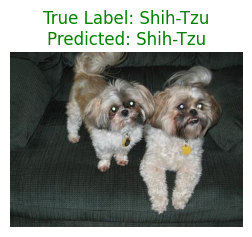

Processing image: downloads/imagewoof10_val/n02096294/n02096294_1370.JPEG
-----------------------------------------------
Total predictions: 91
Correct predictions: 63
Accuracy: 69.23%


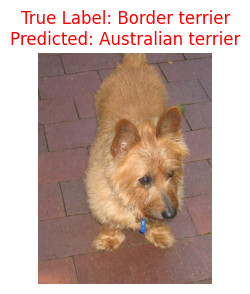

Processing image: downloads/imagewoof10_val/n02105641/n02105641_4451.JPEG
-----------------------------------------------
Total predictions: 92
Correct predictions: 64
Accuracy: 69.57%


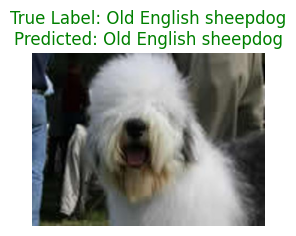

Processing image: downloads/imagewoof10_val/n02111889/n02111889_11692.JPEG
-----------------------------------------------
Total predictions: 93
Correct predictions: 65
Accuracy: 69.89%


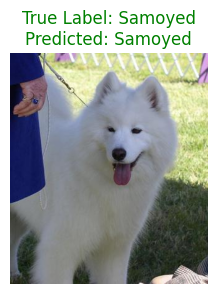

Processing image: downloads/imagewoof10_val/n02088364/n02088364_5480.JPEG
-----------------------------------------------
Total predictions: 94
Correct predictions: 66
Accuracy: 70.21%


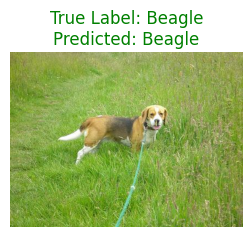

Processing image: downloads/imagewoof10_val/n02105641/n02105641_11611.JPEG
-----------------------------------------------
Total predictions: 95
Correct predictions: 67
Accuracy: 70.53%


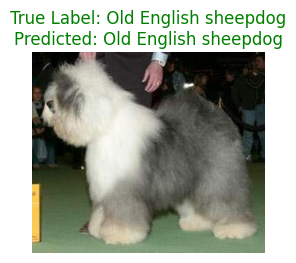

Processing image: downloads/imagewoof10_val/n02093754/n02093754_7900.JPEG
-----------------------------------------------
Total predictions: 96
Correct predictions: 67
Accuracy: 69.79%


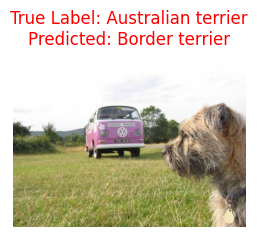

Processing image: downloads/imagewoof10_val/n02088364/n02088364_13391.JPEG
-----------------------------------------------
Total predictions: 97
Correct predictions: 68
Accuracy: 70.10%


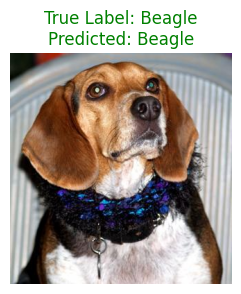

Processing image: downloads/imagewoof10_val/n02088364/n02088364_16502.JPEG
-----------------------------------------------
Total predictions: 98
Correct predictions: 69
Accuracy: 70.41%


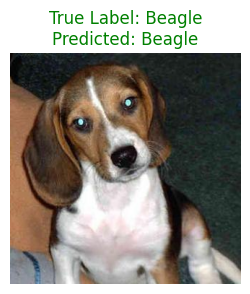

Processing image: downloads/imagewoof10_val/n02088364/ILSVRC2012_val_00009542.JPEG
-----------------------------------------------
Total predictions: 99
Correct predictions: 70
Accuracy: 70.71%


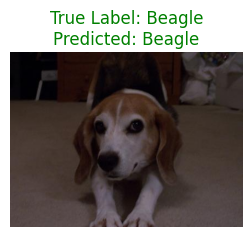

Processing image: downloads/imagewoof10_val/n02115641/n02115641_8840.JPEG
-----------------------------------------------
Total predictions: 100
Correct predictions: 71
Accuracy: 71.00%


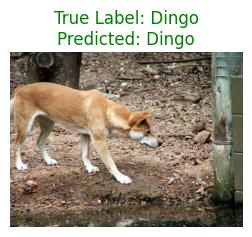

Processing complete. Results are stored in the 'results' list.


In [49]:
correct_predictions = 0
total_predictions = 0

# Loop through the sampled images and call ask_vision for each
results = []
for image_path in sampled_image_list:
    total_predictions += 1
    print(f"Processing image: {image_path}")
    try:
        # Ask vision is defined above to connect to llama
        response = ask_vision(prompt_text=prompt, image_path=image_path)

        # The folder name is the correct label
        sysnet_label = os.path.dirname(image_path).split(os.sep)[-1]

        # Get the descriptive name from the dictionary
        true_label_name = sample_labels.get(sysnet_label, sysnet_label)
        predicted_label_name = sample_labels.get(response, response)

        is_correct = sysnet_label == response
        if is_correct:
          correct_predictions += 1

        accuracy = (correct_predictions / total_predictions) * 100 if total_predictions > 0 else 0

        print("-----------------------------------------------")
        print(f"Total predictions: {total_predictions}")
        print(f"Correct predictions: {correct_predictions}")
        print(f"Accuracy: {accuracy:.2f}%")

        img = Image.open(image_path).convert("RGB")
        plt.figure(figsize=(3,3))
        plt.imshow(img)
        plt.axis("off")
        title_color = 'green' if is_correct else 'red'
        plt.title(f"True Label: {true_label_name}\nPredicted: {predicted_label_name}", color=title_color)
        plt.show()

        results.append({'image_path': image_path,
                        'true_label': true_label_name,
                        'predicted_label': predicted_label_name})

    except Exception as e:
        print(f"Error processing {image_path}: {e}\n")

print("Processing complete. Results are stored in the 'results' list.")

In [52]:
print(results)

[{'image_path': 'downloads/imagewoof10_val/n02115641/n02115641_32260.JPEG', 'true_label': 'Dingo', 'predicted_label': 'Dingo'}, {'image_path': 'downloads/imagewoof10_val/n02111889/n02111889_6811.JPEG', 'true_label': 'Samoyed', 'predicted_label': 'Samoyed'}, {'image_path': 'downloads/imagewoof10_val/n02099601/n02099601_8772.JPEG', 'true_label': 'Golden retriever', 'predicted_label': 'Golden retriever'}, {'image_path': 'downloads/imagewoof10_val/n02086240/n02086240_10061.JPEG', 'true_label': 'Shih-Tzu', 'predicted_label': 'Shih-Tzu'}, {'image_path': 'downloads/imagewoof10_val/n02096294/n02096294_4022.JPEG', 'true_label': 'Border terrier', 'predicted_label': 'Australian terrier'}, {'image_path': 'downloads/imagewoof10_val/n02089973/n02089973_1310.JPEG', 'true_label': 'English foxhound', 'predicted_label': 'Beagle'}, {'image_path': 'downloads/imagewoof10_val/n02086240/n02086240_4872.JPEG', 'true_label': 'Shih-Tzu', 'predicted_label': 'Shih-Tzu'}, {'image_path': 'downloads/imagewoof10_val/n

# Show Final Model Accuracy

In [50]:
print(f"Total predictions: {total_predictions}")
print(f"Correct predictions: {correct_predictions}")
print(f"Accuracy: {accuracy:.2f}%")

Total predictions: 100
Correct predictions: 71
Accuracy: 71.00%


# Display Incorrect Predictions

Displaying images with Correct vs Predicted Labels (Incorrect Predictions Only):


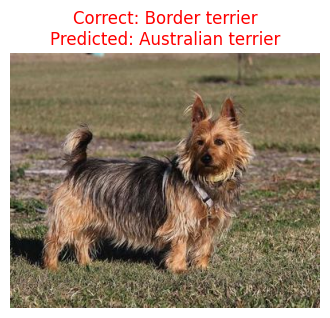

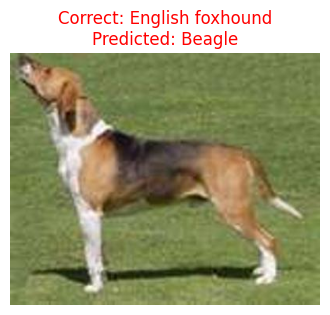

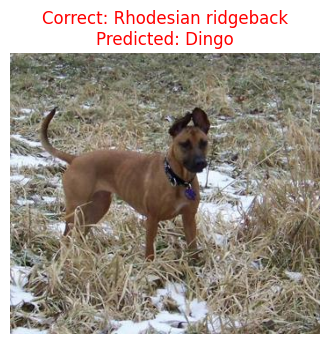

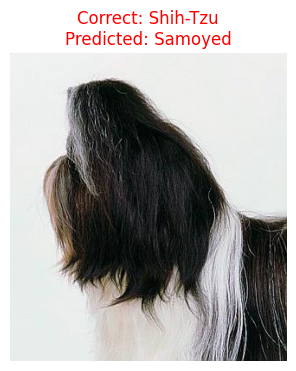

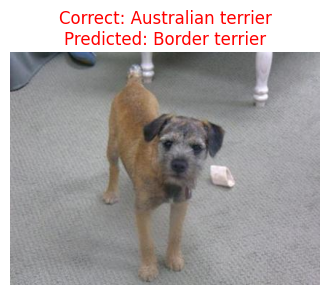

...

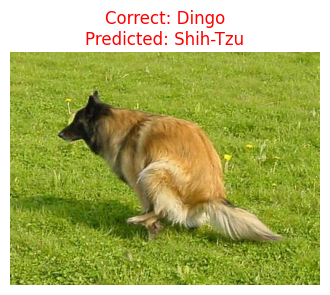

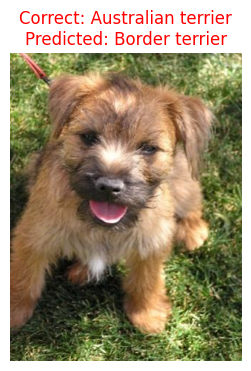

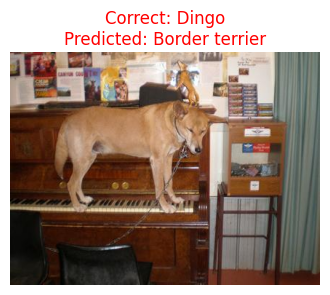

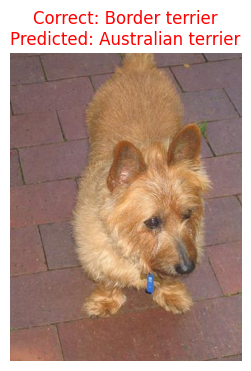

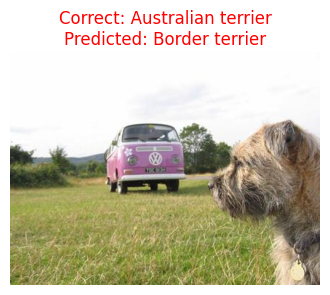

In [51]:

print("Displaying images with Correct vs Predicted Labels (Incorrect Predictions Only):")

# Loop through the results and display images with labels
for result in results:
  # Check if the prediction was incorrect
  if result['true_label'] != result['predicted_label']:

    # Load and display the image
    img = Image.open(result['image_path']).convert("RGB")
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.axis("off")

    # Set the title with correct and predicted labels (color will be red for incorrect)
    plt.title(f"Correct: {result['true_label']}\nPredicted: {result['predicted_label']}", color='red')

    plt.show()

Question 1a
: How accurate is Llama on this basic task with 10 images? all accurate, as I expected. <b>

With 100 samples? the accuracy dropped .
Total predictions: 100
Correct predictions: 53
Accuracy: 53.00%

I dont expect the accuracy were so low with 100 samples.



analysis of  100 images of 10 different dog breeds. <br>
 How accurate is the model in classifying dogs only?
 Total predictions: 100
Correct predictions: 71
Accuracy: 71.00%


 What kind of mistakes is the model making? <br>
 Show some examples of misclassified dogs by using the code with the header “Display Incorrect Predictions”.
 <br>
 Are the mistakes reasonable? Why would this task be easier or more difficult than classifying the 10 basic objects?